In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score,
    adjusted_rand_score,
    normalized_mutual_info_score
)

In [12]:
df = pd.read_csv("../ubernymaio14.csv")

df = df.sample(
    n=20000,
    random_state=42
).reset_index(drop=True)

print("Antes da limpeza:", df.shape)

df = df.dropna()
df = df.drop_duplicates().reset_index(drop=True)

print("Depois da limpeza:", df.shape)
print(df.head())

Antes da limpeza: (20000, 4)
Depois da limpeza: (19985, 4)
            Date/Time      Lat      Lon    Base
0  5/16/2014 15:23:00  40.7809 -73.9791  B02682
1  5/21/2014 19:38:00  40.7682 -73.9823  B02598
2  5/22/2014 19:23:00  40.7351 -73.9880  B02598
3  5/18/2014 12:43:00  40.7686 -73.9635  B02512
4  5/21/2014 19:05:00  40.7223 -73.9917  B02598


In [13]:
df["Date/Time"] = pd.to_datetime(df["Date/Time"])

df["Hour"] = df["Date/Time"].dt.hour
df["Day"] = df["Date/Time"].dt.day

print(df[["Date/Time", "Hour", "Day"]].head())

            Date/Time  Hour  Day
0 2014-05-16 15:23:00    15   16
1 2014-05-21 19:38:00    19   21
2 2014-05-22 19:23:00    19   22
3 2014-05-18 12:43:00    12   18
4 2014-05-21 19:05:00    19   21


In [14]:
print("Valores ausentes:")
print(df.isnull().sum())

print("\nDuplicados:", df.duplicated().sum())

Valores ausentes:
Date/Time    0
Lat          0
Lon          0
Base         0
Hour         0
Day          0
dtype: int64

Duplicados: 0


In [15]:
COLUNAS_CLUSTER = ["Lat", "Lon", "Hour", "Day"]

scaler = MinMaxScaler()

X = scaler.fit_transform(df[COLUNAS_CLUSTER])

print(X[:5])

[[0.57550205 0.41360049 0.65217391 0.5       ]
 [0.56141129 0.41165756 0.82608696 0.66666667]
 [0.52468656 0.40819672 0.82608696 0.7       ]
 [0.5618551  0.42307225 0.52173913 0.56666667]
 [0.51048486 0.40595021 0.82608696 0.66666667]]


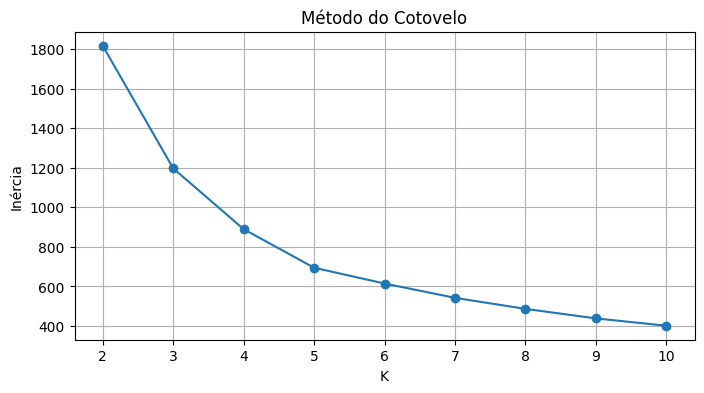

In [16]:
inercias = []

for k in range(2, 11):
    km = KMeans(
        n_clusters=k,
        random_state=42,
        n_init=10
    )
    
    km.fit(X)
    inercias.append(km.inertia_)

plt.figure(figsize=(8,4))
plt.plot(range(2, 11), inercias, marker="o")
plt.xlabel("K")
plt.ylabel("Inércia")
plt.title("Método do Cotovelo")
plt.grid(True)
plt.show()

In [17]:
K = 5

In [18]:
kmeans = KMeans(
    n_clusters=K,
    random_state=42,
    n_init=10
)

labels_kmeans = kmeans.fit_predict(X)


agg = AgglomerativeClustering(
    n_clusters=K,
    linkage="complete"
)

labels_agg = agg.fit_predict(X)


dbscan = DBSCAN(
    eps=0.05,
    min_samples=20
)

labels_dbscan = dbscan.fit_predict(X)

In [19]:
def avaliar_clusterizacao(nome, X, labels):
    labels_unicos = set(labels)
    
    if len(labels_unicos) <= 1:
        return None
    
    if -1 in labels_unicos:
        mask = labels != -1
        X_eval = X[mask]
        labels_eval = labels[mask]
    else:
        X_eval = X
        labels_eval = labels
    
    if len(set(labels_eval)) <= 1:
        return None
    
    return {
        "Algoritmo": nome,
        "Silhouette": silhouette_score(X_eval, labels_eval),
        "Davies-Bouldin": davies_bouldin_score(X_eval, labels_eval),
        "Calinski-Harabasz": calinski_harabasz_score(X_eval, labels_eval),
        "Clusters": len(set(labels_eval))
    }


resultados = []

for nome, labels in [
    ("KMeans", labels_kmeans),
    ("Agglomerative Complete", labels_agg),
    ("DBSCAN", labels_dbscan)
]:
    r = avaliar_clusterizacao(nome, X, labels)
    
    if r is not None:
        resultados.append(r)

resultado_metricas = pd.DataFrame(resultados)

print(resultado_metricas)

                Algoritmo  Silhouette  Davies-Bouldin  Calinski-Harabasz  \
0                  KMeans    0.367316        0.860724       17262.981362   
1  Agglomerative Complete    0.283178        1.116722        9007.384054   
2                  DBSCAN    0.204893        0.611705         507.274322   

   Clusters  
0         5  
1         5  
2         5  


In [20]:
seeds = [0, 1, 2, 42, 100]

rotulos = []

for seed in seeds:
    km = KMeans(
        n_clusters=K,
        random_state=seed,
        n_init=10
    )
    
    labels = km.fit_predict(X)
    rotulos.append(labels)

comparacoes = []

for i in range(len(seeds)):
    for j in range(i + 1, len(seeds)):
        ari = adjusted_rand_score(rotulos[i], rotulos[j])
        nmi = normalized_mutual_info_score(rotulos[i], rotulos[j])
        
        comparacoes.append({
            "Seed 1": seeds[i],
            "Seed 2": seeds[j],
            "ARI": ari,
            "NMI": nmi
        })

comparacoes_df = pd.DataFrame(comparacoes)

print(comparacoes_df)

   Seed 1  Seed 2       ARI       NMI
0       0       1  0.993413  0.989246
1       0       2  0.994221  0.991099
2       0      42  0.993413  0.989246
3       0     100  0.999425  0.998987
4       1       2  0.993476  0.990379
5       1      42  1.000000  1.000000
6       1     100  0.993985  0.990258
7       2      42  0.993476  0.990379
8       2     100  0.993649  0.990426
9      42     100  0.993985  0.990258


In [21]:
df_resultado = df.copy()

df_resultado["cluster_kmeans"] = labels_kmeans
df_resultado["cluster_dbscan"] = labels_dbscan

print(df_resultado.head())

            Date/Time      Lat      Lon    Base  Hour  Day  cluster_kmeans  \
0 2014-05-16 15:23:00  40.7809 -73.9791  B02682    15   16               3   
1 2014-05-21 19:38:00  40.7682 -73.9823  B02598    19   21               3   
2 2014-05-22 19:23:00  40.7351 -73.9880  B02598    19   22               1   
3 2014-05-18 12:43:00  40.7686 -73.9635  B02512    12   18               3   
4 2014-05-21 19:05:00  40.7223 -73.9917  B02598    19   21               3   

   cluster_dbscan  
0               0  
1               0  
2               0  
3               0  
4               0  


In [22]:
resumo_temporal = df_resultado.groupby("cluster_kmeans")["Hour"].describe()

print(resumo_temporal)

                 count       mean       std   min   25%   50%   75%   max
cluster_kmeans                                                           
0               3282.0   7.474101  3.493116   0.0   6.0   8.0  10.0  13.0
1               4254.0  17.925247  3.000362  12.0  15.0  18.0  20.0  23.0
2               4540.0  18.119163  2.828370  13.0  16.0  18.0  21.0  23.0
3               4823.0  17.618495  2.938892  11.0  15.0  18.0  20.0  23.0
4               3086.0   7.132858  3.478181   0.0   5.0   8.0  10.0  13.0


In [23]:
for c in sorted(df_resultado["cluster_kmeans"].unique()):
    dados_cluster = df_resultado[df_resultado["cluster_kmeans"] == c]
    
    hora_pico = dados_cluster["Hour"].mode()[0]
    
    print(f"Cluster {c}: pico em {hora_pico}h")

Cluster 0: pico em 8h
Cluster 1: pico em 17h
Cluster 2: pico em 18h
Cluster 3: pico em 17h
Cluster 4: pico em 7h


In [24]:
coordenadas_medias = df_resultado.groupby("cluster_kmeans")[["Lat", "Lon"]].mean()

print(coordenadas_medias)

                      Lat        Lon
cluster_kmeans                      
0               40.740289 -73.972138
1               40.739307 -73.975362
2               40.741462 -73.974404
3               40.741349 -73.975791
4               40.739262 -73.972895


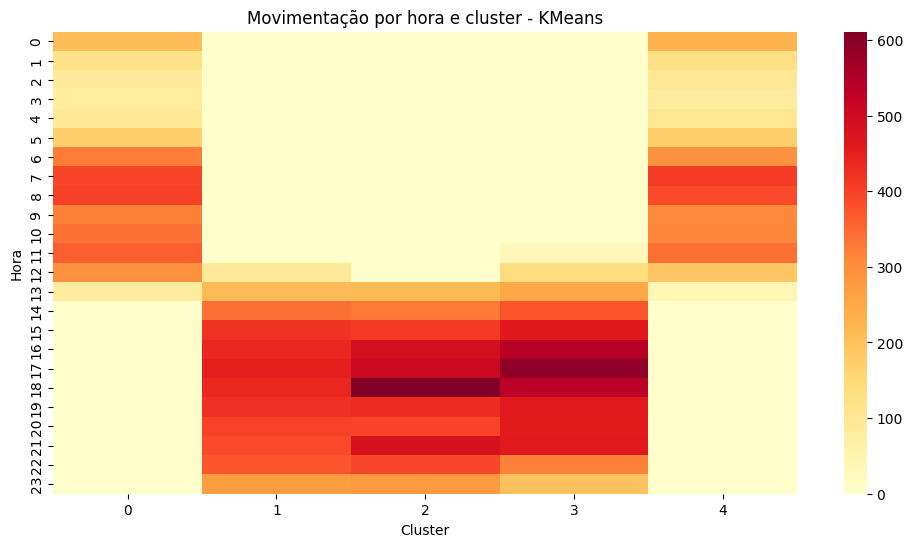

In [25]:
import seaborn as sns

tabela_hora_cluster = pd.crosstab(
    df_resultado["Hour"],
    df_resultado["cluster_kmeans"]
)

plt.figure(figsize=(12,6))

sns.heatmap(
    tabela_hora_cluster,
    cmap="YlOrRd"
)

plt.title("Movimentação por hora e cluster - KMeans")
plt.xlabel("Cluster")
plt.ylabel("Hora")

plt.show()

In [26]:
import folium

mapa_pontos = folium.Map(
    location=[40.75, -73.98],
    zoom_start=10
)

for _, row in df_resultado.iterrows():
    folium.CircleMarker(
        location=[row["Lat"], row["Lon"]],
        radius=1,
        fill=True,
        fill_opacity=0.4
    ).add_to(mapa_pontos)

mapa_pontos

In [ ]:
mapa_pontos.save("mapa_pontos_20k_aleatorio.html")

print("Mapa salvo como mapa_pontos_20k_aleatorio.html")